# Interpretability of the trained model

In the repo a syntetical data (generated by a special GAN) is available to test the notebook. 

In [75]:
import tensorflow as tf
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [76]:
import shap
import lime
import eli5
from pdpbox import pdp, get_dataset, info_plots


# tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.layers import AlphaDropout
from tensorflow.keras import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD, Adam

# sklearn
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import RandomizedSearchCV
import xgboost
from sklearn.ensemble import RandomForestClassifier

In [77]:
tf.test.is_gpu_available(cuda_only=True,
    min_cuda_compute_capability=None
)

False

## import the data

In [78]:
featuretype = pd.read_csv('feature_types_final.csv', sep=';')
df = pd.read_csv('data_clean_onehot_final_withnans.csv', sep=';').dropna()

# preprocess
df_imp_wonan_dumm = df.sample(frac=1)
dataset = df_imp_wonan_dumm.values
# test and validation ratio
test_step = .1
valid_step = .1

# features and output
X = dataset[:,0:-1]
Y = dataset[:,-1]

# indexing
valid_index = int(X.shape[0]*(1-valid_step-test_step))
test_index = int(X.shape[0]*(1-test_step))

# test split
X_test = X[test_index:]
Y_test = Y[test_index:]
#Y_test = to_categorical(Y[test_index:],2)

# validation split
X_valid = X[valid_index:test_index]
Y_valid = Y[valid_index:test_index]
#Y_valid = to_categorical(Y[valid_index:test_index],2)

# training split
X_train = X[:test_index]
Y_train = Y[:test_index]
#Y_train = to_categorical(Y[:test_index],2)


# MinMax scaling

scaler = MinMaxScaler(feature_range=(0, 1)).fit(X_train)
x_train = scaler.transform(X_train)
x_test = scaler.transform(X_test)
x_valid = scaler.transform(X_valid)
y_train = Y_train.astype(int)
y_test = Y_test.astype(int)
y_valid = Y_valid.astype(int)

In [79]:
print(x_train.shape, '\n',
     x_test.shape, '\n',
     x_valid.shape, '\n',
     y_train.shape, '\n',
     y_test.shape, '\n',
     y_valid.shape, '\n')

(4713, 46) 
 (524, 46) 
 (524, 46) 
 (4713,) 
 (524,) 
 (524,) 



## Loading the trained model

In [80]:
fin_model = tf.keras.models.load_model("model_final2.hdf5")
fin_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 24)                1128      
_________________________________________________________________
dropout (Dropout)            (None, 24)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 24)                600       
_________________________________________________________________
dropout_1 (Dropout)          (None, 24)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 24)                600       
_________________________________________________________________
dropout_2 (Dropout)          (None, 24)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 24)                6

In [81]:
from sklearn.metrics import accuracy_score
print("testacc.: {}".format(accuracy_score(y_test, np.round(fin_model.predict(x_test)))))
print("trainacc.: {}".format(accuracy_score(y_train, np.round(fin_model.predict(x_train)))))

testacc.: 0.6908396946564885
trainacc.: 0.7021005728835137


## Sklearn wrapper around the keras model

 We need this because some of the interpretability packages only work with sklearn models.
 
 (It is tricky to load a trained model into the KerasClassifier model without further training.)

In [82]:
def load_model_return_build_fn(path):
    model = tf.keras.models.load_model(path)
    def build_fn(*args, **kwars):
        return model
    return build_fn

build_fn = load_model_return_build_fn("model_final2.hdf5")

keras_classifier = KerasClassifier(build_fn,
                                   batch_size=32, 
                                    epochs=1, 
                                    verbose=0,
                                    shuffle=True)
 
keras_classifier.fit(x_train[:1,], y_train[:1,])
#keras_classifier.model = fin_model

In [83]:
keras_classifier.model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 24)                1128      
_________________________________________________________________
dropout (Dropout)            (None, 24)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 24)                600       
_________________________________________________________________
dropout_1 (Dropout)          (None, 24)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 24)                600       
_________________________________________________________________
dropout_2 (Dropout)          (None, 24)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 24)                6

In [84]:
print(keras_classifier.model.predict(x_test[:5,]), '\n',
      #keras_classifier.predict(x_test[:5,]), '\n',
      keras_classifier.predict_proba(x_test[:5,]), '\n',
      keras_classifier.score(x_test[:50,], y_test[:50]))

[[0.5137124 ]
 [0.85185874]
 [0.25391063]
 [0.7073042 ]
 [0.25562385]] 
 [[0.4862876  0.5137124 ]
 [0.14814126 0.85185874]
 [0.74608934 0.25391063]
 [0.29269582 0.7073042 ]
 [0.7443762  0.25562385]] 
 0.42


strangely the predict() method does not work

# Interpretability packages

We will try out and further investigate the methods and packages listed below.

### Feature types

We need to get back the information about the types of the features in order to use the interpretability methods later.

In [85]:
featuretype

,name,type
0,program_code_prog_1,category
1,program_code_prog_10,category
2,program_code_prog_11,category
3,program_code_prog_12,category
4,program_code_prog_13,category
5,program_code_prog_14,category
6,program_code_prog_15,category
7,program_code_prog_16,category
8,program_code_prog_17,category
9,program_code_prog_18,category


In [86]:
cat_cols = [i[1]['name'] for i in featuretype.iterrows() if i[1]['type']=='category' ]
print(cat_cols)

num_cols = [i[1]['name'] for i in featuretype.iterrows() if i[1]['type']=='numeric' ]
print(num_cols)

bool_cols = [i[1]['name'] for i in featuretype.iterrows() if i[1]['type']=='bool' ]
print(bool_cols)

all_feature_cols = cat_cols + bool_cols + num_cols

['program_code_prog_1', 'program_code_prog_10', 'program_code_prog_11', 'program_code_prog_12', 'program_code_prog_13', 'program_code_prog_14', 'program_code_prog_15', 'program_code_prog_16', 'program_code_prog_17', 'program_code_prog_18', 'program_code_prog_19', 'program_code_prog_2', 'program_code_prog_3', 'program_code_prog_4', 'program_code_prog_5', 'program_code_prog_6', 'program_code_prog_7', 'program_code_prog_8', 'program_code_prog_9', 'financing_source_self_funded', 'financing_source_state_funded', 'gender_Female', 'gender_Male', 'place_of_hs_capital_city', 'place_of_hs_city_w_county_rights', 'place_of_hs_town', 'ues_calc_method_doubling', 'ues_calc_method_summation']
['ues', 'extra_points', 'foreign_lang', 'hun_lang_lit', 'math', 'history', 'elective_subj', 'foreign_lang_hs', 'hun_lit_hs', 'hun_lang_hs', 'math_hs', 'history_hs', 'science_hs', 'foreign_lang_score', 'years_between', 'surplus_score']
['re_enrolling', 'competition']


In [87]:
target_var = 'final_status'

In [88]:
bigdf =pd.DataFrame(x_train, columns=all_feature_cols)
bigdf[target_var] = y_train

In [89]:
for c in cat_cols:
    bigdf[c] = bigdf[c].astype('category')
for c in bool_cols + [target_var]:
    bigdf[c] = bigdf[c].astype('bool')

In [90]:
bigdf.head()

,program_code_prog_1,program_code_prog_10,program_code_prog_11,program_code_prog_12,program_code_prog_13,program_code_prog_14,program_code_prog_15,program_code_prog_16,program_code_prog_17,program_code_prog_18,...,foreign_lang_hs,hun_lit_hs,hun_lang_hs,math_hs,history_hs,science_hs,foreign_lang_score,years_between,surplus_score,final_status
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.000000,0.666667,0.666667,1.000000,0.500000,1.000000,0.25,0.000000,0.937896,True
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.000000,1.000000,1.000000,1.000000,0.666667,1.000000,0.50,0.000000,0.562370,False
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.500000,0.666667,0.833333,0.500000,0.666667,0.666667,0.25,0.000000,0.017422,True
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.833333,1.000000,1.000000,0.833333,1.000000,0.833333,0.00,0.041667,0.609304,True
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.000000,1.000000,1.000000,0.833333,1.000000,1.000000,0.25,0.333333,0.080889,True


In [91]:
bigdf.describe()

,ues,extra_points,foreign_lang,hun_lang_lit,math,history,elective_subj,foreign_lang_hs,hun_lit_hs,hun_lang_hs,math_hs,history_hs,science_hs,foreign_lang_score,years_between,surplus_score
count,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000,4713.000000
mean,0.554765,0.635249,0.510142,0.564187,0.564129,0.448095,0.534020,0.904838,0.777212,0.779829,0.815086,0.789589,0.887899,0.375610,0.053027,0.327096
std,0.193047,0.331996,0.158711,0.100258,0.176813,0.117024,0.170994,0.165291,0.247185,0.228325,0.226539,0.241610,0.179110,0.221839,0.106915,0.207543
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.419192,0.555556,0.423423,0.501792,0.451613,0.386555,0.425000,0.833333,0.666667,0.666667,0.666667,0.666667,0.833333,0.250000,0.000000,0.162311
50%,0.555556,0.694444,0.477477,0.580645,0.540323,0.453782,0.500000,1.000000,0.833333,0.833333,0.833333,0.833333,1.000000,0.250000,0.000000,0.303407
75%,0.702020,0.861111,0.531532,0.637993,0.649194,0.521008,0.600000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,0.041667,0.466667
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [92]:
bigdf.describe(include=['category', 'bool'])

,program_code_prog_1,program_code_prog_10,program_code_prog_11,program_code_prog_12,program_code_prog_13,program_code_prog_14,program_code_prog_15,program_code_prog_16,program_code_prog_17,program_code_prog_18,...,gender_Female,gender_Male,place_of_hs_capital_city,place_of_hs_city_w_county_rights,place_of_hs_town,ues_calc_method_doubling,ues_calc_method_summation,re_enrolling,competition,final_status
count,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,...,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,4713.0,4713,4713,4713
unique,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2,2,2
top,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,False,False,False
freq,3950.0,4304.0,4658.0,4637.0,4654.0,4643.0,4510.0,4541.0,4597.0,4580.0,...,3585.0,3585.0,3018.0,2818.0,3590.0,3265.0,3265.0,4020,4561,2375


# PDPbox

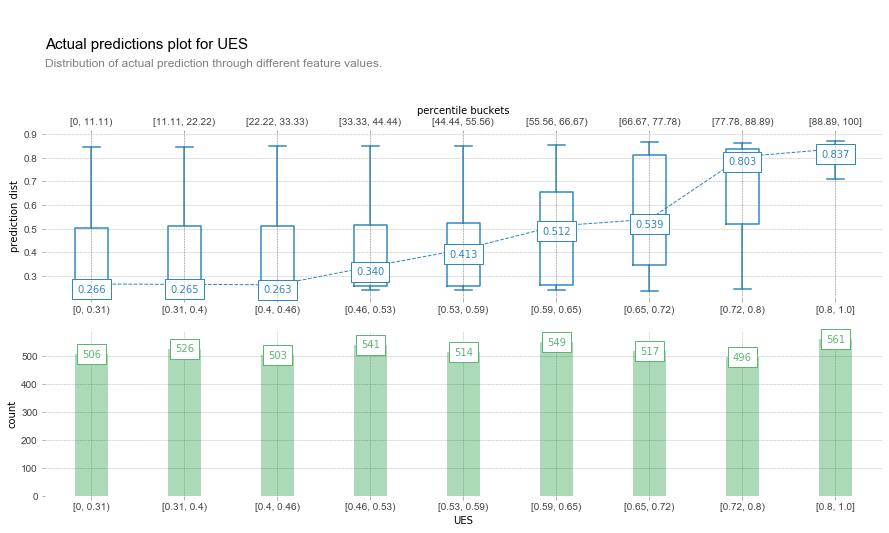

In [107]:
fig, axes, summary_df = info_plots.actual_plot(model=fin_model, X=bigdf[all_feature_cols],
                                               feature='ues', feature_name='UES',
                                               show_percentile=True, predict_kwds = {})

In [108]:
fig.savefig("actpredplot.pdf", bbox_inches="tight")

# Local Interpretable Model-agnostic Explanations (LIME)

In [94]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(Y_train)
class_names = le.classes_

cat_cols_indeces=[]
cat_names={}
for i, c in enumerate(list(df)):
    if c in cat_cols + bool_cols:
        le = LabelEncoder()
        le.fit(x_train[:, i])
        cat_cols_indeces.append(c)
        cat_names[c]=le.classes_
        
print(cat_names)

{'program_code_prog_1': array([0., 1.]), 'program_code_prog_10': array([0., 1.]), 'program_code_prog_11': array([0., 1.]), 'program_code_prog_12': array([0., 1.]), 'program_code_prog_13': array([0., 1.]), 'program_code_prog_14': array([0., 1.]), 'program_code_prog_15': array([0., 1.]), 'program_code_prog_16': array([0., 1.]), 'program_code_prog_17': array([0., 1.]), 'program_code_prog_18': array([0., 1.]), 'program_code_prog_19': array([0., 1.]), 'program_code_prog_2': array([0., 1.]), 'program_code_prog_3': array([0., 1.]), 'program_code_prog_4': array([0., 1.]), 'program_code_prog_5': array([0., 1.]), 'program_code_prog_6': array([0., 1.]), 'program_code_prog_7': array([0., 1.]), 'program_code_prog_8': array([0., 1.]), 'program_code_prog_9': array([0., 1.]), 'financing_source_self_funded': array([0., 1.]), 'financing_source_state_funded': array([0., 1.]), 'gender_Female': array([0., 1.]), 'gender_Male': array([0., 1.]), 'place_of_hs_capital_city': array([0., 1.]), 'place_of_hs_city_w

In [24]:
lexplainer = lime.lime_tabular.LimeTabularExplainer(x_train,
                                                    mode='classification',
                                                    feature_names = all_feature_cols,
                                                    class_names = class_names,
                                                    categorical_features=cat_cols_indeces, 
                                                    categorical_names=cat_names)

i = np.random.choice(range(x_test.shape[1]))
exp = lexplainer.explain_instance(x_test[i,], keras_classifier.predict_proba)
exp.show_in_notebook(show_all=True)

# Eli5
### Permuted Feature Importance

In [95]:
from eli5.sklearn import PermutationImportance
from sklearn.metrics import accuracy_score
from eli5.permutation_importance import get_score_importances

def modelscore(X, y):
    y_pred = np.round(fin_model.predict(X))
    return accuracy_score(y, y_pred)

base_score, score_decreases = get_score_importances(modelscore, x_train, y_train)
feature_importances = np.mean(score_decreases, axis=0)

In [96]:
perm_impor = pd.DataFrame({'name': all_feature_cols, 'importance': feature_importances}).sort_values('importance', ascending=False)

In [97]:
perm_impor

,name,importance
44,years_between,0.044685
0,program_code_prog_1,0.024783
45,surplus_score,0.020284
18,program_code_prog_9,0.018205
34,math,0.014428
19,financing_source_self_funded,0.013792
30,ues,0.011245
40,math_hs,0.011161
22,gender_Male,0.011076
27,ues_calc_method_summation,0.010948


In [98]:
perm_impor['importance']=perm_impor['importance'].round(4)
perm_impor.head(10).to_latex("perm_importance_train.tex")

In [99]:
base_score2, score_decreases2 = get_score_importances(modelscore, x_test, y_test)
feature_importances2 = np.mean(score_decreases2, axis=0)
perm_impor2 = pd.DataFrame({'name': all_feature_cols, 'importance': feature_importances2}).sort_values('importance', ascending=False)
perm_impor2

,name,importance
44,years_between,0.054580
18,program_code_prog_9,0.029008
27,ues_calc_method_summation,0.020229
45,surplus_score,0.019466
11,program_code_prog_2,0.015649
19,financing_source_self_funded,0.014885
24,place_of_hs_city_w_county_rights,0.009924
22,gender_Male,0.007634
20,financing_source_state_funded,0.007252
0,program_code_prog_1,0.006870


# Shapley Value (SHAP)

In [130]:
# create an instance of the DeepSHAP which is called DeepExplainer
background = x_train
#background = pd.DataFrame(background, columns=all_feature_cols)
explainer = shap.GradientExplainer(fin_model, data=background)


# Fit the explainer on a subset of the data (you can try all but then gets slower)
forexplain = x_train
shap_values = explainer.shap_values(forexplain)

In [124]:
# initialize js methods for visualization
shap.initjs()

data_for_prediction = x_test
shap.force_plot(0, shap_values[0], data_for_prediction[0)

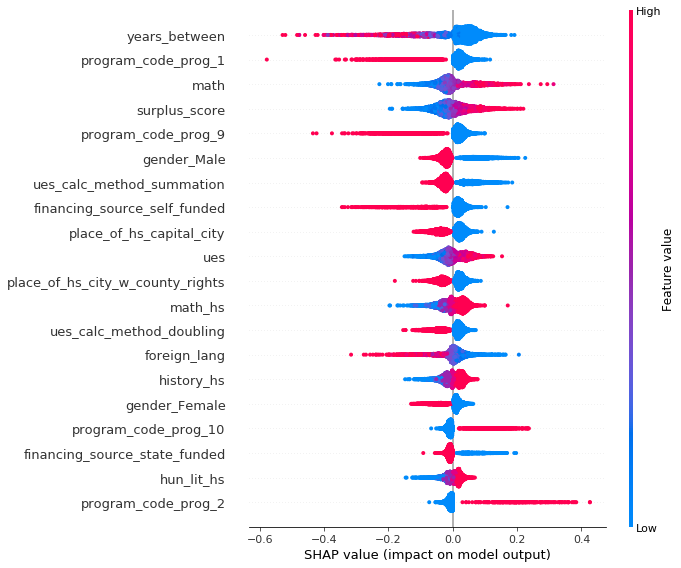

In [133]:
shap.summary_plot(shap_values[:][0], background, feature_names = all_feature_cols)